In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import HDBSCAN
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from umap import UMAP

import models
from data_frame import DataFrame, MaxFiller, MAGNITUDES, COLORS
from histogram_plotter import HistPlotter
from utils import load_config, load_model

DATAPATH = "../dataframes/experiment3/MG_3_components_3.csv"

df = pd.read_csv(DATAPATH, index_col=0)
df, indices = df.loc[(df["split"] == "test") & (~df["faint"]) & (~df["has_missing"])], df.index
columns_100 = df.columns[-100:]

<b>Korelacje</b>

In [55]:
df[COLORS + ["Z_pred_std"]].corr().iloc[-1,:].sort_values(ascending=False)

Z_pred_std    1.000000
u-Ks          0.258383
i1-Ks         0.245127
u-J           0.235219
u-H           0.234042
i1-J          0.231240
i2-Ks         0.227571
Z-Ks          0.227144
u-Y           0.224418
g-Ks          0.210336
u-r           0.209916
i1-Y          0.209742
i1-H          0.208354
r-Ks          0.202904
i2-J          0.200217
Z-J           0.200082
u-Z           0.198542
i2-H          0.187379
u-g           0.186517
g-J           0.186103
u-i2          0.181773
g-H           0.178618
u-i1          0.176113
Z-Y           0.173293
r-J           0.172853
g-Y           0.170543
Z-H           0.170110
Y-Ks          0.167638
i2-Y          0.165835
r-H           0.164271
J-Ks          0.147269
r-Y           0.145993
g-r           0.134928
g-Z           0.124048
i1-Z          0.117829
H-Ks          0.116990
Y-H           0.093032
g-i2          0.090668
Y-J           0.088420
g-i1          0.078665
i2-Z          0.074263
r-Z           0.064985
J-H           0.043510
i1-i2      

<b>Wykresy korelacji</b>

In [51]:
# sns.pairplot(df.sample(2000), x_vars=["Z_pred_std"], y_vars=COLORS + MAGNITUDES, kind="kde", height=3.5, plot_kws=dict(alpha=1))

<b>Redukcja wymiarów - T-sne</b>

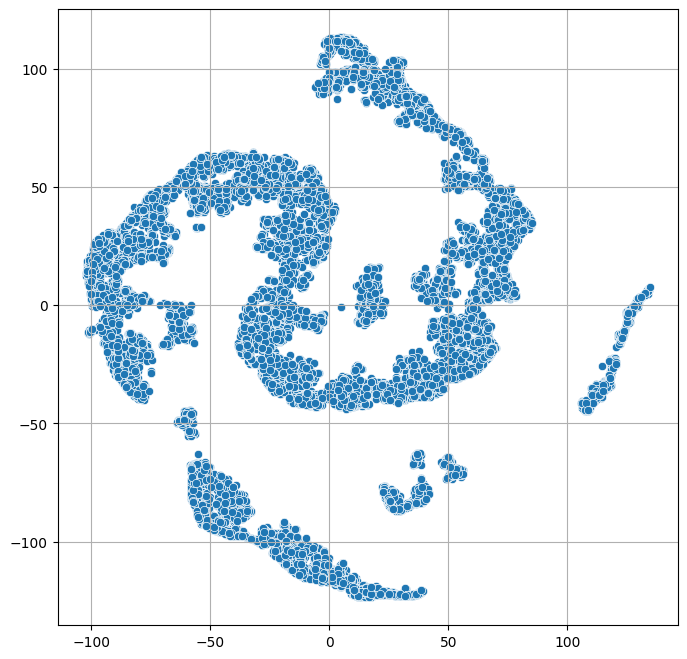

In [6]:
X_scaled = StandardScaler().fit_transform(df[columns_100])
X_emb = TSNE(n_components=2, perplexity=50, learning_rate=200, max_iter=8000,
             init="random", metric="correlation", random_state=0, n_jobs=-1).fit_transform(X_scaled)

plt.figure(figsize=(8,8))
sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1])
plt.grid()
plt.show()

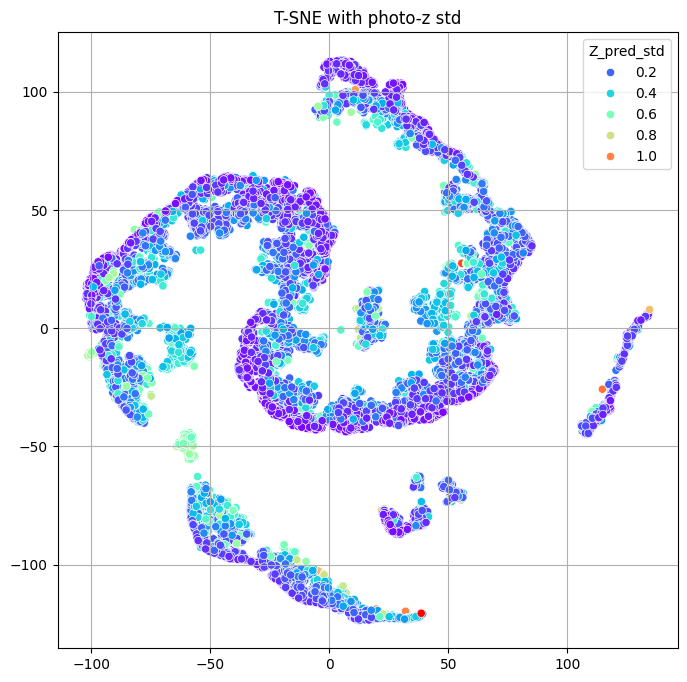

In [7]:
plt.figure(figsize=(8,8))
sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=df["Z_pred_std"], palette="rainbow")
plt.grid()
plt.title("T-SNE with photo-z std")
plt.show()

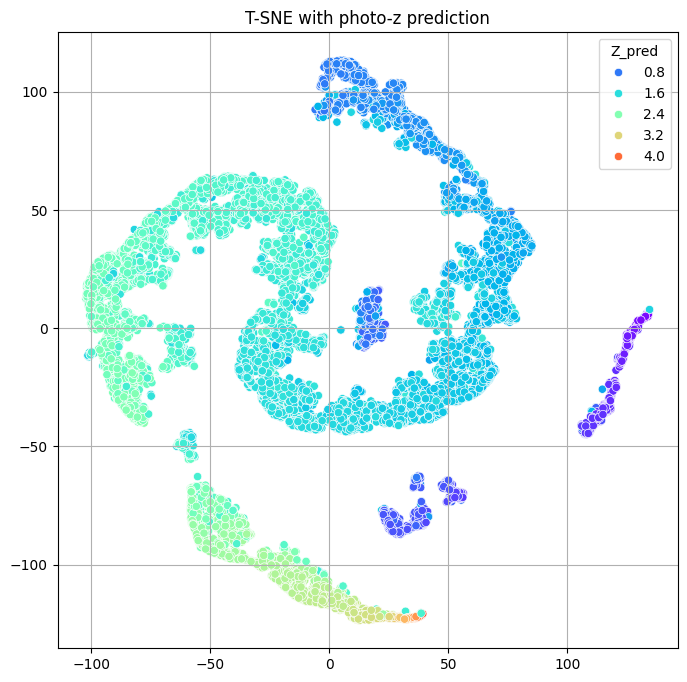

In [8]:
plt.figure(figsize=(8,8))
sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=df["Z_pred"], palette="rainbow")
plt.grid()
plt.title("T-SNE with photo-z prediction")
plt.show()

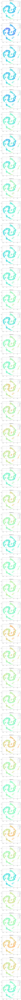

In [9]:
fig, axes = plt.subplots(45, 1, figsize=(7,360))
for ax, color in zip(axes, COLORS):
    sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=df[color], palette="rainbow", ax=ax)
    ax.grid(True)
    ax.set_title(f"T-SNE with {color}")
plt.show()

<b>Clustering HDBSCAN</b>

0 
 3    9963
 2    1863
 0     503
 1     470
 4     346
-1       2
Name: count, dtype: int64


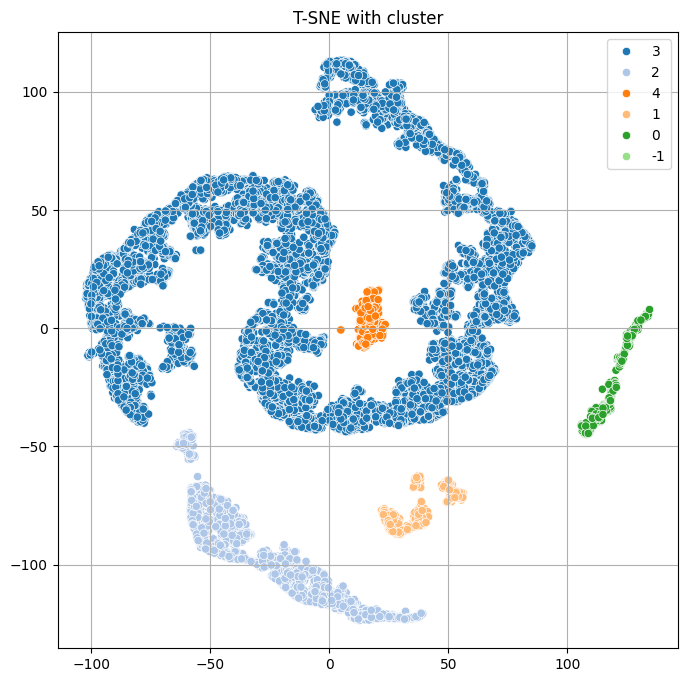

In [25]:
clusters = HDBSCAN(min_cluster_size=260, min_samples=30, metric="euclidean").fit_predict(X_emb)
df["cluster"] = clusters.astype(str)

print(pd.DataFrame(clusters).value_counts())

plt.figure(figsize=(8,8))
sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=clusters.astype(str), palette="tab20")
plt.grid()
plt.title("T-SNE with cluster")
plt.show()

In [13]:
df[["cluster", "Z_pred"]].groupby("cluster", sort=False).describe()

Z_pred                                                              \
          count      mean       std       min       25%       50%       75%   
cluster                                                                       
3        9963.0  1.600654  0.412120  0.751860  1.285307  1.604082  1.902565   
2        1863.0  2.666191  0.392908  1.438108  2.488421  2.669781  2.873205   
4         346.0  0.794908  0.159235  0.584751  0.708978  0.743718  0.809019   
1         470.0  0.583844  0.114869  0.370280  0.538996  0.564297  0.593545   
0         503.0  0.317477  0.148982  0.070536  0.225105  0.329684  0.372016   
-1          2.0  1.494175  0.032969  1.470863  1.482519  1.494175  1.505832   

                   
              max  
cluster            
3        4.635896  
2        4.302029  
4        1.578043  
1        1.409511  
0        1.484374  
-1       1.517488

In [14]:
df[["cluster", "Z_pred_std"]].groupby("cluster", sort=False).describe()

Z_pred_std                                                    \
             count      mean       std       min       25%       50%   
cluster                                                                
3           9963.0  0.197152  0.123769  0.044040  0.106158  0.158763   
2           1863.0  0.280375  0.171297  0.084535  0.158268  0.223018   
4            346.0  0.281740  0.158852  0.089853  0.171187  0.225442   
1            470.0  0.166949  0.125738  0.055537  0.079520  0.142877   
0            503.0  0.166470  0.129293  0.063646  0.111465  0.131476   
-1             2.0  0.517103  0.003847  0.514383  0.515743  0.517103   

                             
              75%       max  
cluster                      
3        0.250582  1.088263  
2        0.335093  1.193801  
4        0.333225  0.817580  
1        0.192803  0.863244  
0        0.163369  1.021892  
-1       0.518463  0.519823

In [15]:
df[["cluster", "Z_spec_prob"]].groupby("cluster", sort=False).describe()

Z_spec_prob                                                        \
              count      mean       std           min       25%       50%   
cluster                                                                     
3            9963.0  3.510798  3.169102  3.194469e-11  1.282971  2.868790   
2            1863.0  2.181908  1.528177  1.217200e-06  0.937099  2.039446   
4             346.0  5.603005  4.313786  9.659785e-05  1.398797  5.317867   
1             470.0  7.211719  4.573148  9.079924e-08  3.638923  7.223252   
0             503.0  8.822023  5.051355  1.084498e-04  4.660662  9.172905   
-1              2.0  0.319616  0.296903  1.096735e-01  0.214645  0.319616   

                               
               75%        max  
cluster                        
3         4.873961  30.461260  
2         3.040762   7.265247  
4         8.710666  18.508371  
1        10.032825  21.735909  
0        12.714056  19.611120  
-1        0.424587   0.529558

<b>Histogramy clustrów</b>

In [18]:
config_path = "configs/config.yml"
config = load_config(config_path)

filePath = "../KiDS-DR5-WCScut_x_DESI-DR1-small.fits"

dframe = DataFrame(filePath, "QSO", MaxFiller())
X_train, y_train = dframe.get_train_dataset()
features = dframe.features

scaler = StandardScaler()
scaler.fit(X_train)

modelPath = f"../models/experiment2/MG_{config["num_components"]}_components_3/variables/variables"
model = load_model(modelPath, models.MixtureGaussian, dframe, config)

2025-10-13 17:39:21.284306: E tensorflow/core/util/util.cc:131] oneDNN supports DT_INT32 only on platforms with AVX-512. Falling back to the default Eigen-based implementation if present.


Chi^2: 382.2492295191318


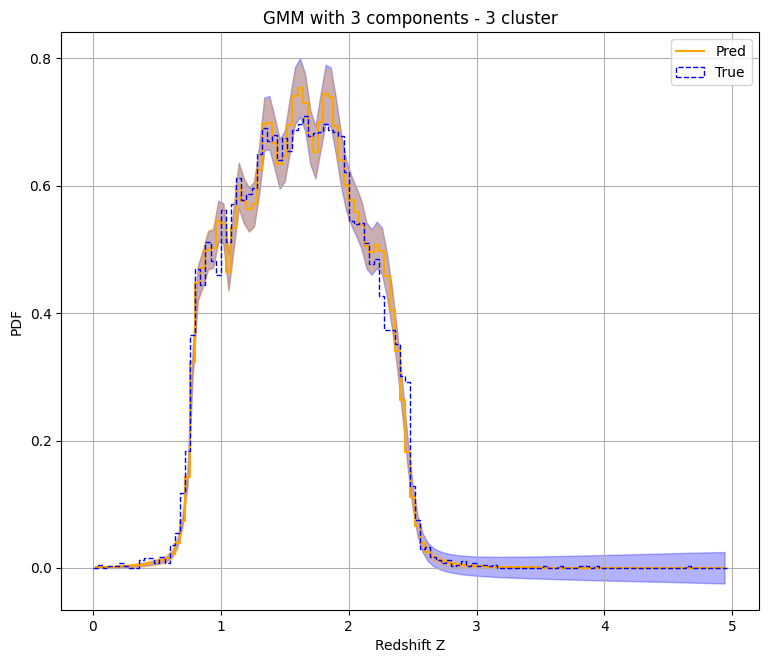

Chi^2: 1502.2853650506277


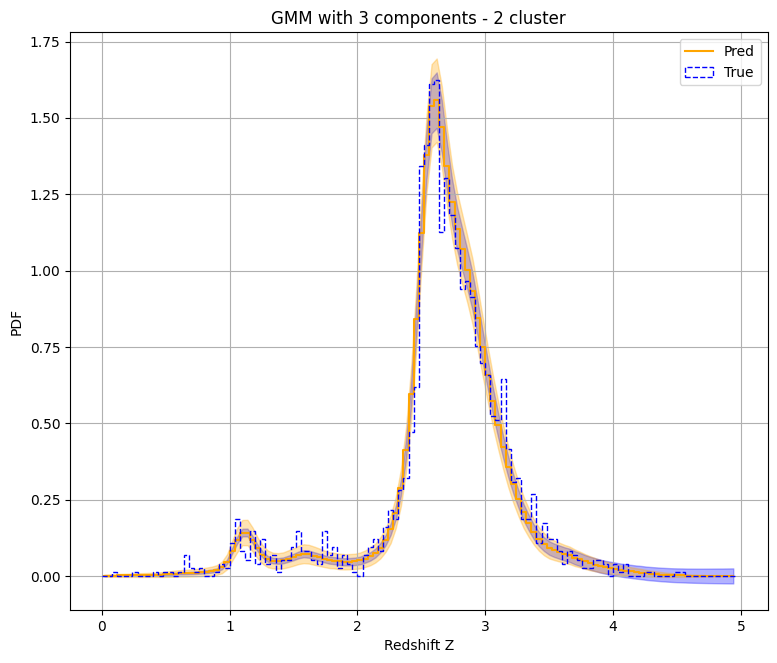

Chi^2: 1649.849242036076


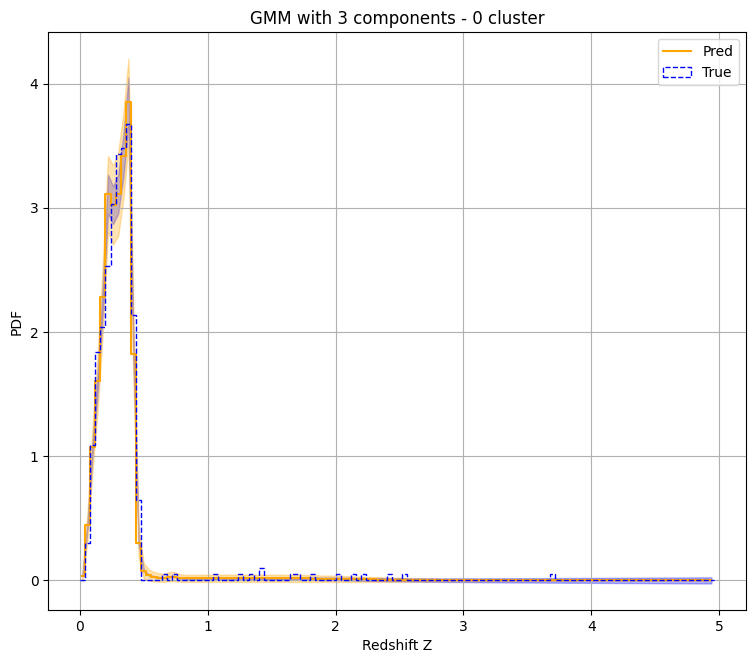

Chi^2: 5136.556442243781


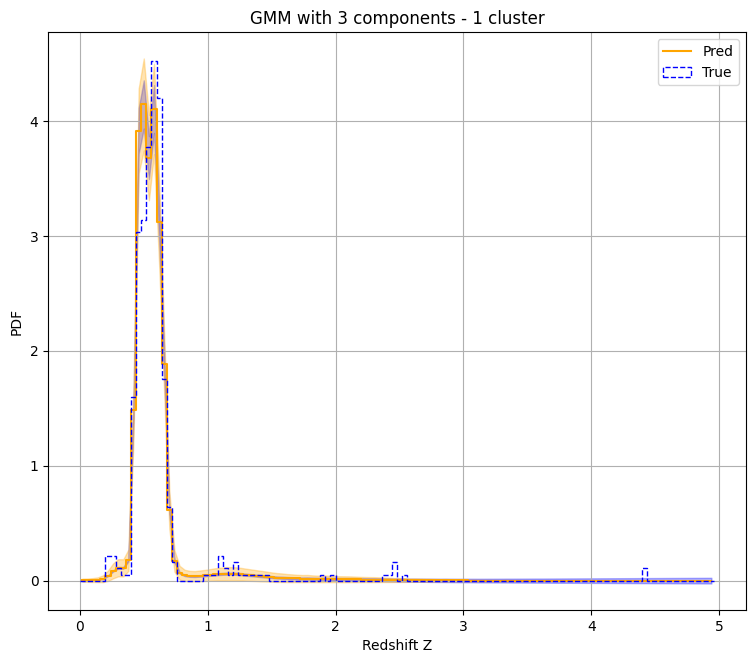

Chi^2: 4810.898940321383


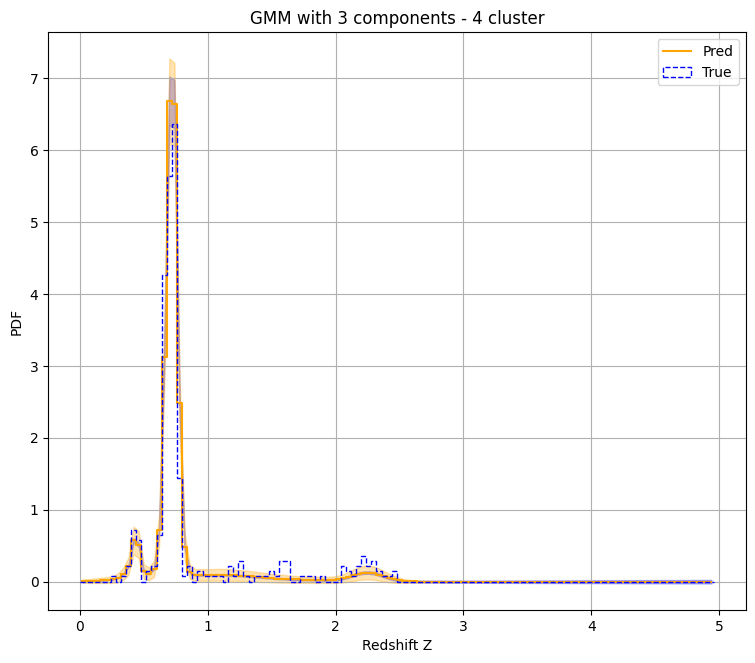

Chi^2: 403604.5585409233


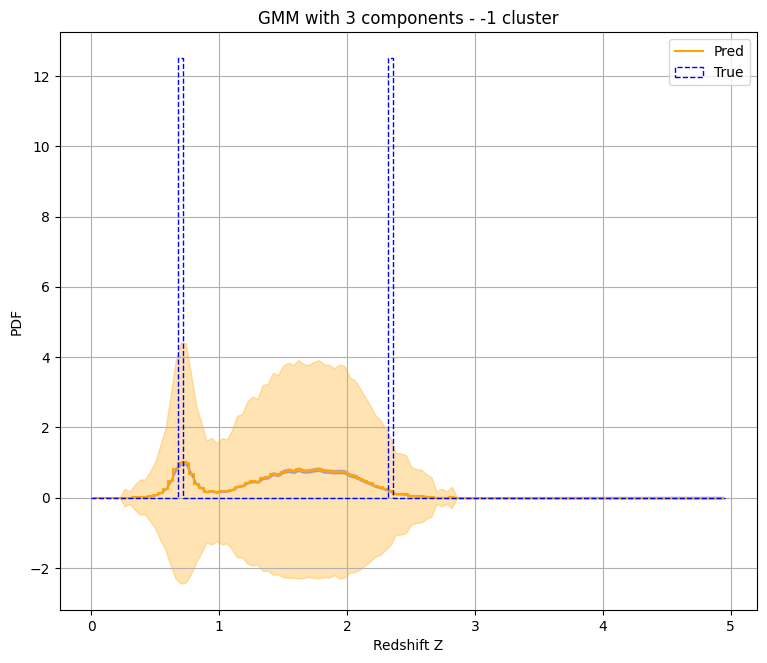

In [19]:
clusters = df["cluster"].value_counts().index.values

def return_cluster(df, cluster_num):
    df = df.loc[df["cluster"] == cluster_num]
    X, y = df.loc[:, features], df.loc[:, "Z"]
    X = scaler.transform(X)
    return X, y

for cluster in clusters:
    X, y = return_cluster(df, cluster)
    histPlotter = HistPlotter(X, y, f"{cluster}", model, "GMM")
    histPlotter.evaluate_model()

<b>Wykres korelacji z clustrami</b>

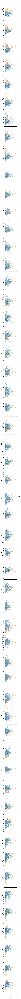

In [20]:
sns.pairplot(df.sample(int(df.shape[0] * 0.1)), x_vars=["Z_pred_std"], y_vars=COLORS + MAGNITUDES, kind="scatter", hue="cluster", palette="tab20", height=3.5, plot_kws=dict(s=30, alpha=0.5))